### Imports and Mounting

In [4]:
#fastbook install
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 8.3MB/s 
     |████████████████████████████████| 51kB 7.9MB/s 
     |████████████████████████████████| 194kB 52.1MB/s 
     |████████████████████████████████| 1.2MB 25.8MB/s 
     |████████████████████████████████| 61kB 9.3MB/s 
     |████████████████████████████████| 61kB 9.8MB/s 
Mounted at /content/gdrive


In [35]:
#hide
from fastai.vision.all import *
from fastai.vision.widgets import *
from fastbook import *
import os
import re
from google.colab import drive, files

matplotlib.rc('image', cmap='Greys')

In [45]:
BASSET_DIR = Path(os.getcwd() + '/gdrive/MyDrive/Development/basset_hounds')
BASSET_DIR_IMAGES = BASSET_DIR/"images"
BASSET_DIR_MODELS = BASSET_DIR/"models"

In [46]:
if not BASSET_DIR_IMAGES.exists():
  BASSET_DIR_IMAGES.mkdir()
if not BASSET_DIR_MODELS.exists():
  BASSET_DIR_MODELS.mkdir()

In [7]:
BING_KEY = os.environ.get('AZURE_SEARCH_KEY', '298e1f0a99c74f378fe9276a769d839f')

### Download Data

In [47]:
results = search_images_bing(BING_KEY, 'tri-color basset hound')
ims = results.attrgot('contentUrl')
len(ims)

150

In [48]:
results[0]

{'accentColor': '976734',
 'contentSize': '273660 B',
 'contentUrl': 'http://www.pets4homes.co.uk/images/classifieds/2014/07/07/688165/large/basset-hound-bitch-puppy-tri-color-7-months-53bab0c5c14a3.jpg',
 'datePublished': '2014-07-18T08:58:00.0000000Z',
 'encodingFormat': 'jpeg',
 'height': 851,
 'hostPageDiscoveredDate': '2014-07-18T08:58:00.0000000Z',
 'hostPageDisplayUrl': 'www.pets4homes.co.uk/classifieds/688165-basset-hound-bitch-puppy-tri-color-7-months...',
 'hostPageUrl': 'http://www.pets4homes.co.uk/classifieds/688165-basset-hound-bitch-puppy-tri-color-7-months-ludlow.html',
 'imageId': '743AE1BDA6B8D06D66B3BCC2C763651170504FDE',
 'imageInsightsToken': 'ccid_AA23fFdM*cp_DA5FAAB74F71487C4B323ED03C493CB1*mid_743AE1BDA6B8D06D66B3BCC2C763651170504FDE*simid_608027718365745451*thid_OIP.AA23fFdM4B1o8A-yMMsaTgHaE7',
 'insightsMetadata': {'availableSizesCount': 1,
  'pagesIncludingCount': 1,
  'recipeSourcesCount': 0},
 'isFamilyFriendly': True,
 'name': 'Basset Hound bitch puppy tri 

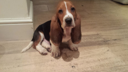

In [50]:
test_image_url = results[0]['contentUrl']
test_image_url
dest = BASSET_DIR_IMAGES/"tri-color-test.jpg"
download_url(test_image_url, dest)
test_image = Image.open(dest)
test_image.to_thumb(128,128)

In [70]:
os.remove(BASSET_DIR_IMAGES/"tri-color-test.jpg")

In [83]:
basset_types = ['tri-color', 'lemon', 'red and white']
if not BASSET_DIR_IMAGES.exists():
  BASSET_DIR_IMAGES.mkdir()
for color in basset_types:
  dest = (BASSET_DIR_IMAGES/color)
  dest.mkdir(exist_ok=True)
  results = search_images_bing(BING_KEY, f'{color} basset hound')
  download_images(dest, urls=results.attrgot('contentUrl'))


 Download of http://huggablebassets.com/PHOTOS/JESSE/IMG_1114.jpg has failed after 5 retries
 Fix the download manually:
$ mkdir -p /content/gdrive/MyDrive/Development/basset_hounds/images/tri-color
$ cd /content/gdrive/MyDrive/Development/basset_hounds/images/tri-color
$ wget -c http://huggablebassets.com/PHOTOS/JESSE/IMG_1114.jpg
$ tar xf IMG_1114.jpg
 And re-run your code once the download is successful


 Download of http://huggablebassets.com/PHOTOS/JESSE/IMG_0621.jpg has failed after 5 retries
 Fix the download manually:
$ mkdir -p /content/gdrive/MyDrive/Development/basset_hounds/images/tri-color
$ cd /content/gdrive/MyDrive/Development/basset_hounds/images/tri-color
$ wget -c http://huggablebassets.com/PHOTOS/JESSE/IMG_0621.jpg
$ tar xf IMG_0621.jpg
 And re-run your code once the download is successful


 Download of http://huggablebassets.com/PHOTOS/MOTANA/IMG_7124.jpg has failed after 5 retries
 Fix the download manually:
$ mkdir -p /content/gdrive/MyDrive/Development/basset

In [129]:
# need to correct this error - saved some images as "###.jpg?###"
for color_folder in os.listdir(BASSET_DIR_IMAGES):
    print('Color: %s' % color_folder)
    color_folder_path = os.path.join(BASSET_DIR_IMAGES, color_folder)
    for image_file in os.listdir(color_folder_path):
        image_file_path = str(os.path.join(color_folder_path, image_file))
        if len(image_file_path.split('?')) > 1:
            os.rename(image_file_path, image_file_path.split('?')[0])

Color: tri-color
Color: lemon
Color: red and white


In [124]:
filename_updates = {filename: filename.split('?')[0]
                    for filename in image_file_paths}
filename_updates['/content/gdrive/MyDrive/Development/basset_hounds/images/tri-color/00000028.jpg?6f1c354f4433e7ea']

'/content/gdrive/MyDrive/Development/basset_hounds/images/tri-color/00000028.jpg'

In [131]:
fns = get_image_files(BASSET_DIR_IMAGES)

In [133]:
failed = verify_image(fns)
failed

False

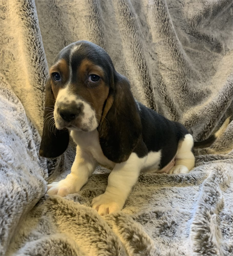

In [132]:
Image.open(fns[100]).to_thumb(256, 256)

### Data Preparation
DataBlocks, transformations, augmentations

In [8]:
bassets = DataBlock(
    # tuple for independent and dependent variables
    blocks=(ImageBlock, CategoryBlock),

    # function to get items: get_image_files takes in images at path
    get_items=get_image_files,

    # 20% for validation
    splitter=RandomSplitter(valid_pct=0.2, seed=34),

    # parent_label is function that gets the name of folder that file is in
    get_y=parent_label,

    # transform image to same size
    # Resize 
    item_tfms=Resize(128)
)

In [9]:
dataloaders = bassets.dataloaders(BASSET_DIR_IMAGES)

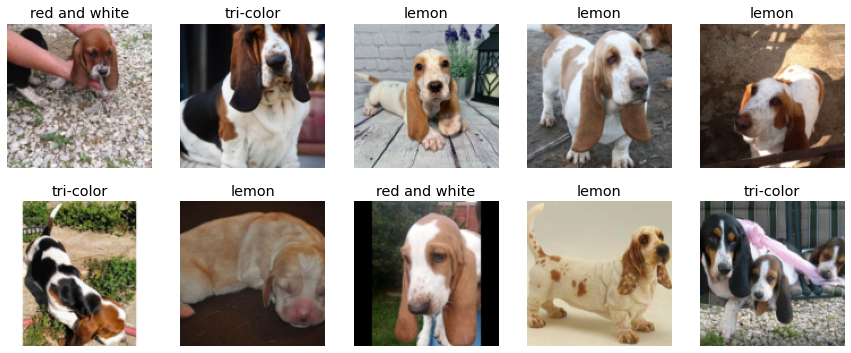

In [10]:
dataloaders.valid.show_batch(max_n=10, nrows=2)

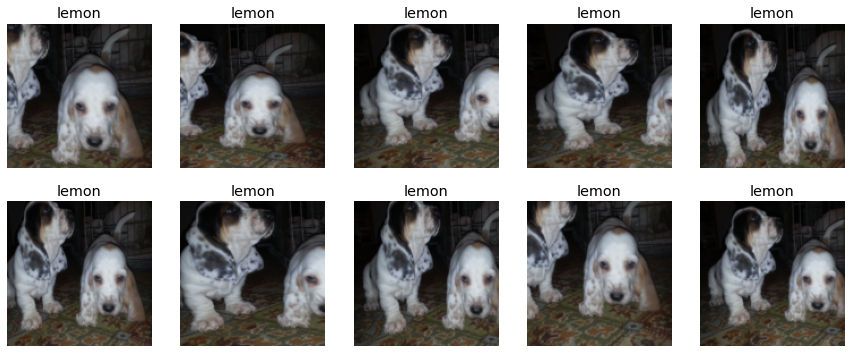

In [11]:
bassets = bassets.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dataloaders = bassets.dataloaders(BASSET_DIR_IMAGES)
dataloaders.train.show_batch(max_n=10, nrows=2, unique=True)

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:1023: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  /pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:760.)
  ret = func(*args, **kwargs)


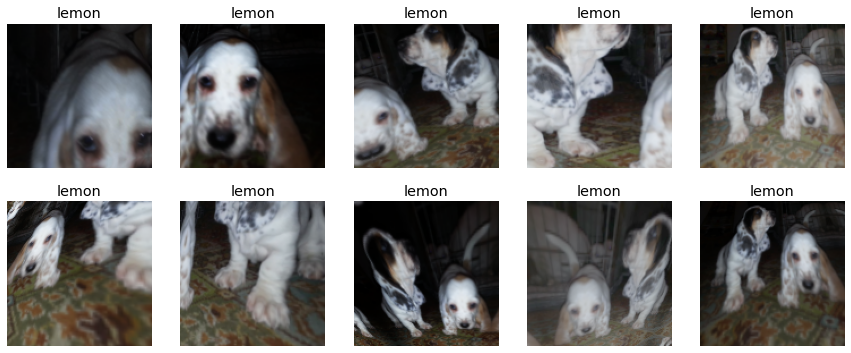

In [12]:
bassets = bassets.new(item_tfms=RandomResizedCrop(128),
                      batch_tfms=aug_transforms(mult=2))
# aug_transforms is set of common data augmentation techniques: rotation,
# flipping, perspective warping, brightness / contrast changes

dataloaders = bassets.dataloaders(BASSET_DIR_IMAGES)
dataloaders.train.show_batch(max_n=10, nrows=2, unique=True)

### Model Training

In [27]:
bassets = bassets.new(
    # 224px is standard for image classification
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)
dataloaders = bassets.dataloaders(BASSET_DIR_IMAGES)

In [28]:
# at this point, got some UnidentifiedImageError's, even after fixing extensions
# I just deleted the files on Google Drive manually
# they were weird / wouldn't open

model = cnn_learner(dataloaders, resnet18, metrics=error_rate)
model.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.878428,1.223815,0.500000,00:18


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fe2dc15d050>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fe2dc15d050>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho

epoch,train_loss,valid_loss,error_rate,time
0,1.066919,0.786963,0.311111,00:08
1,1.024081,0.744033,0.222222,00:08
2,0.905728,0.811818,0.288889,00:08
3,0.826530,0.798873,0.255556,00:08


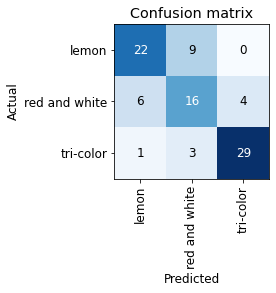

In [29]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix()

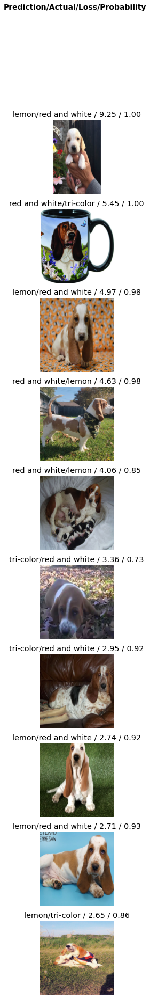

In [32]:
interp.plot_top_losses(10, nrows=10)

In [36]:
# fancy UI to make fixing data as easy as possible
cleaner = ImageClassifierCleaner(model)
cleaner

In [37]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx, cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

### Saving Model for Inference

In [38]:
? model.export()

In [47]:
model.export(BASSET_DIR_MODELS/"model_20210628_2050.pkl")

### Inference

In [49]:
model_inf = load_learner(BASSET_DIR_MODELS/"model_20210628_2050.pkl")

In [53]:
model_inf.predict(BASSET_DIR_IMAGES/"tri-color/00000149.jpg")
# this output is in this format:
# - predicted category
# - index of predicted category
# 

('tri-color', tensor(2), tensor([3.1013e-03, 4.0737e-05, 9.9686e-01]))

In [55]:
model_inf.dls.vocab

['lemon', 'red and white', 'tri-color']